In [92]:
import pandas as pd
from bifacial_peak_shaving import *
from _utils import *
pd.options.plotting.backend='plotly'

# Data

In [93]:
dir = './Data/'

## Load

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8760 entries, 2010-01-01 00:00:00 to 2010-12-31 23:00:00
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Load (kW)  8760 non-null   float64
dtypes: float64(1)
memory usage: 136.9 KB
None
         Load (kW)
count  8760.000000
mean      0.644127
std       0.628674
min       0.077000
25%       0.239000
50%       0.398000
75%       0.822000
max       4.198000


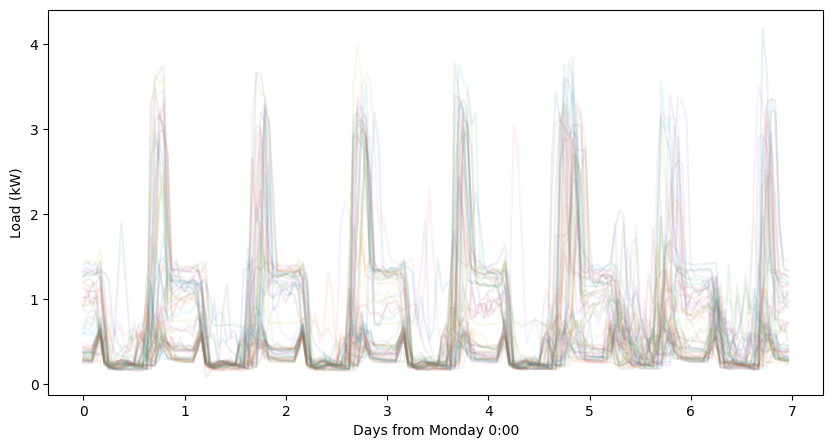

In [94]:
load = pd.read_csv( dir+'HabitatZEH_load_solar_60min.csv',
                    comment='#',
                    index_col=0,
                    usecols=['Datetime','Load (kW)'],#,'Solar (kW)'],
                    parse_dates=True,
                     )\
                        .loc['2010']

print(load.info())
print(load.describe())
plot_weekly(load['Load (kW)'],interval_min=60,alpha=0.1)
load.plot()

## Solar

- 7 kWp, TMY

- Net zero capacity

  - $capacity[kWp] = production[kWh] \times yield [\frac{kWh}{kWp}]^{-1}$

In [95]:
solar_angles = ['s20','w20','w90','s20w90']
solar = pd.concat(( 
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_s20deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_w20deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_w90deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_3.5kwp_s20deg_3.5kwp_w90deg.csv',index_col=0),
                   ),
                  axis=1)
solar.index = pd.date_range('1900-1-1 0:00',periods=8760,freq='1h')
solar.columns = solar_angles
net_zero_capacity = load['Load (kW)'].sum() / (solar.s20.sum()/7) # load=production / yield
solar = solar * net_zero_capacity/7 # scale to net 0
#solar = solar * 2 # randomly scale up
solar.describe()

,s20,w20,w90,s20w90
count,8760.000000,8760.000000,8760.000000,8760.000000
mean,0.644127,0.575808,0.616027,0.630600
std,0.909434,0.812695,0.809819,0.803106
min,-0.002241,-0.002241,-0.002042,-0.001874
25%,-0.000265,-0.000265,-0.000265,-0.000265
50%,-0.000265,-0.000265,-0.000265,-0.000265
75%,1.273619,1.128846,1.186470,1.359219
max,3.675095,3.540659,3.102842,2.855343


In [96]:
# for col in solar:
#     plot_daily(solar[col],title=col,interval_min=60)

## Plot weekly

In [97]:
solar.index = load.index
df = pd.concat((load,solar),axis=1)
df.columns = ['load'] + ['solar_'+x for x in solar.columns]
for angle in solar.columns:
    df[f'netload_{angle}'] = df['load'] - solar[angle]
df    

,load,solar_s20,solar_w20,solar_w90,solar_s20w90,netload_s20,netload_w20,netload_w90,netload_s20w90
Datetime,,,,,,,,,
2010-01-01 00:00:00,0.268,-0.000265,-0.000265,-0.000265,-0.000265,0.268265,0.268265,0.268265,0.268265
2010-01-01 01:00:00,0.266,-0.000265,-0.000265,-0.000265,-0.000265,0.266265,0.266265,0.266265,0.266265
2010-01-01 02:00:00,0.271,-0.000265,-0.000265,-0.000265,-0.000265,0.271265,0.271265,0.271265,0.271265
2010-01-01 03:00:00,0.393,-0.000265,-0.000265,-0.000265,-0.000265,0.393265,0.393265,0.393265,0.393265
2010-01-01 04:00:00,0.280,-0.000265,-0.000265,-0.000265,-0.000265,0.280265,0.280265,0.280265,0.280265
...,...,...,...,...,...,...,...,...,...
2010-12-31 19:00:00,3.123,-0.000265,-0.000265,-0.000265,-0.000265,3.123265,3.123265,3.123265,3.123265
2010-12-31 20:00:00,3.039,-0.000265,-0.000265,-0.000265,-0.000265,3.039265,3.039265,3.039265,3.039265
2010-12-31 21:00:00,3.279,-0.000265,-0.000265,-0.000265,-0.000265,3.279265,3.279265,3.279265,3.279265


load v s20

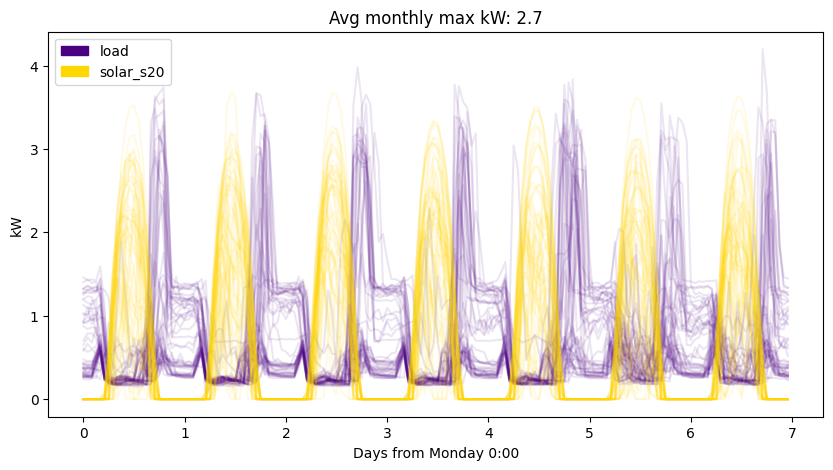

In [98]:
l = df['load']
s = df['solar_s20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

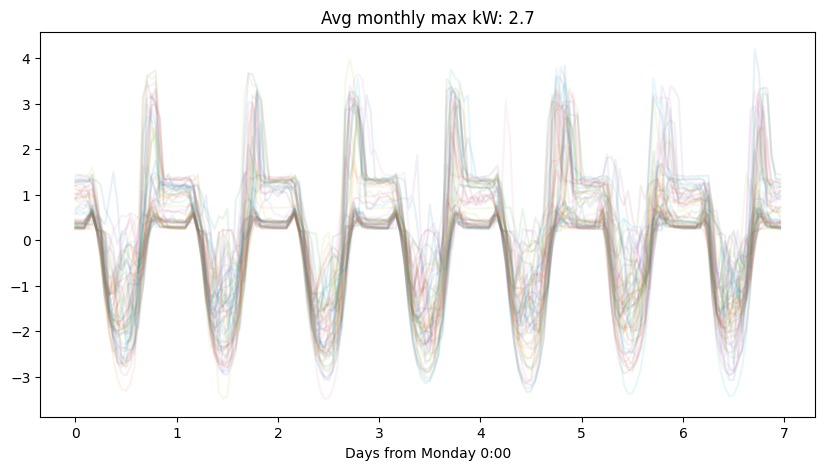

In [99]:
l = df['load']
s = df['solar_s20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w20

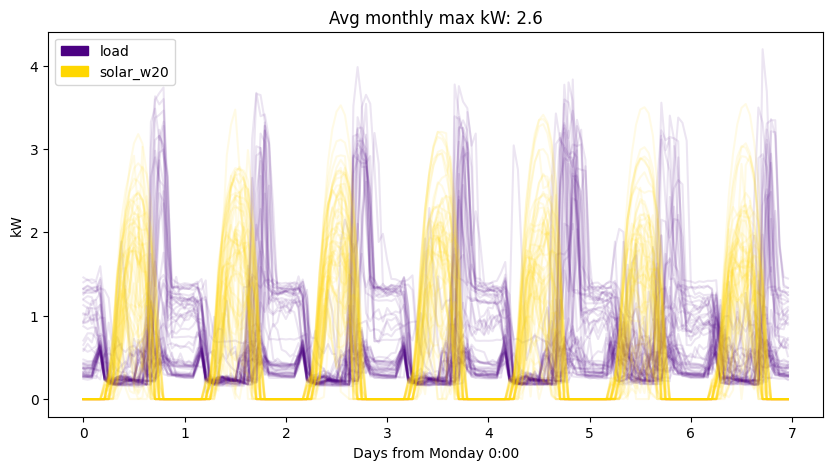

In [100]:
l = df['load']
s = df['solar_w20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

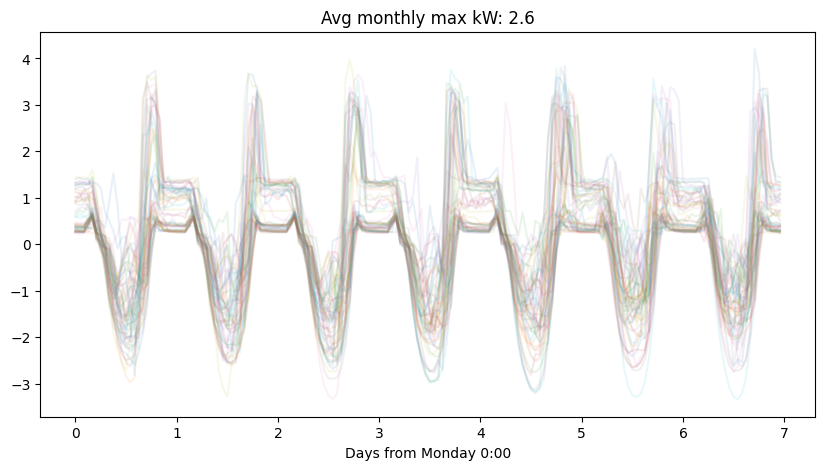

In [101]:
l = df['load']
s = df['solar_w20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w90

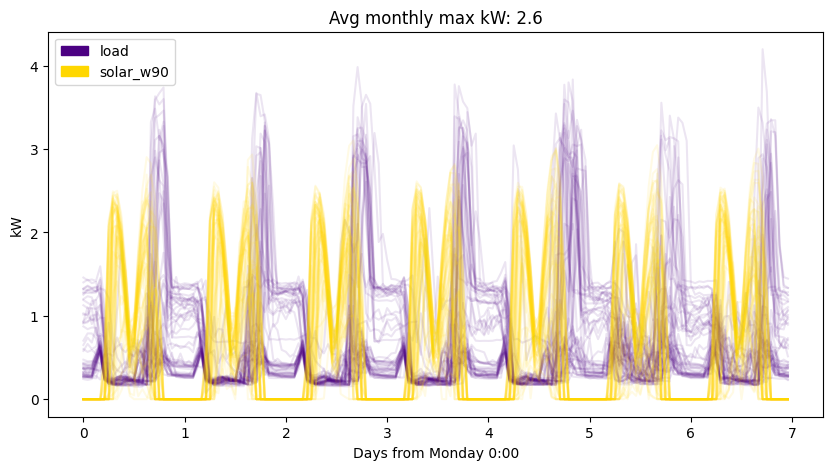

In [102]:
l = df['load']
s = df['solar_w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

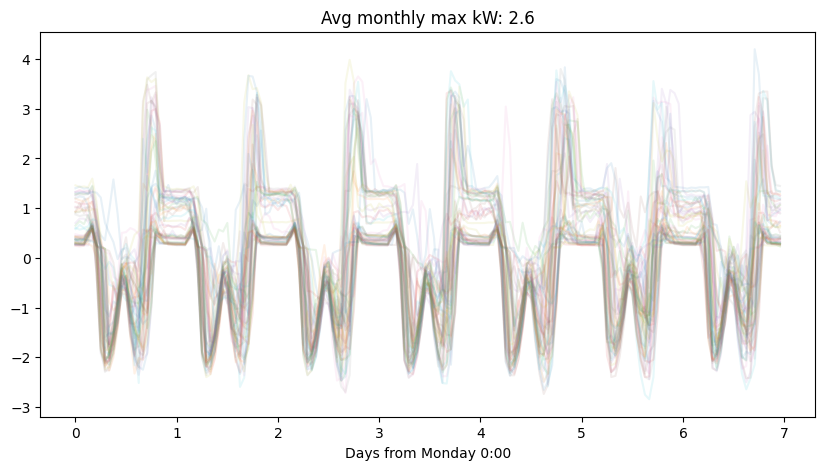

In [103]:
l = df['load']
s = df['solar_w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v s20w90

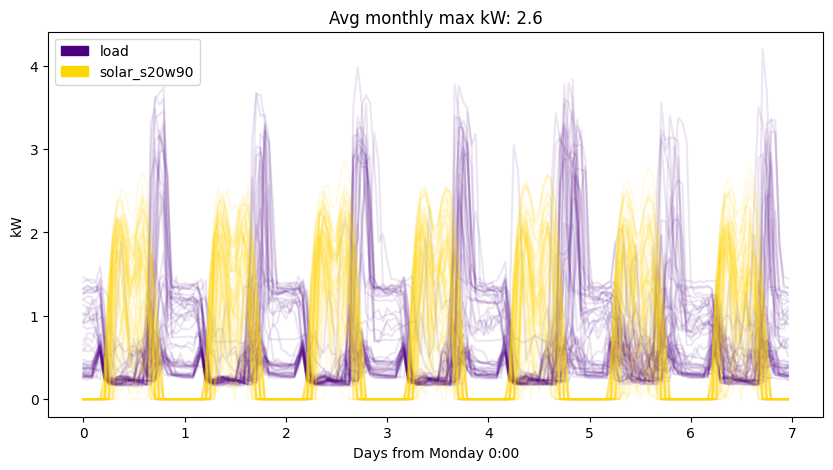

In [104]:
l = df['load']
s = df['solar_s20w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

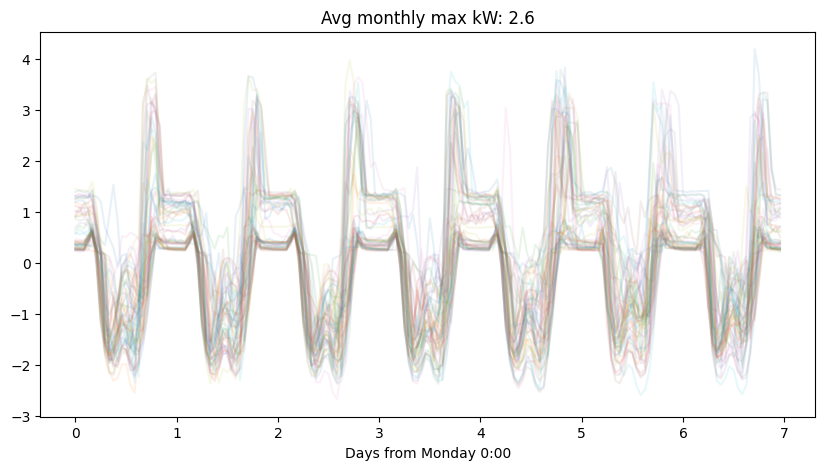

In [105]:
l = df['load']
s = df['solar_s20w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

# Monthly peaks

## Single TOU

In [106]:
peak_begin,peak_end = 8,11
angle = 's20'
peaks = calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)

angle = 'w20'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 'w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 's20w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

print('Avg w20 reduction',peaks['netload_s20->w20 reduc kw'].mean())
print('Avg w90 reduction',peaks['netload_s20->w90 reduc kw'].mean())
print('Avg s20w90 reduction',peaks['netload_s20->s20w90 reduc kw'].mean())
peaks

Avg w20 reduction -0.05833333333333332
Avg w90 reduction 0.125
Avg s20w90 reduction 0.08333333333333333


,netload_s20 kw,netload_s20 t,netload_w20 kw,netload_w20 t,netload_s20->w20 reduc kw,netload_w90 kw,netload_w90 t,netload_s20->w90 reduc kw,netload_s20w90 kw,netload_s20w90 t,netload_s20->s20w90 reduc kw
1,1.5,2010-01-04 09:00:00,1.5,2010-01-04 09:00:00,0.0,1.6,2010-01-04 09:00:00,-0.1,1.5,2010-01-04 09:00:00,0.0
2,1.6,2010-02-06 09:00:00,1.6,2010-02-06 09:00:00,0.0,1.6,2010-02-06 09:00:00,0.0,1.6,2010-02-06 09:00:00,0.0
3,0.1,2010-03-06 08:00:00,0.3,2010-03-06 08:00:00,-0.2,0.1,2010-03-06 08:00:00,0.0,0.1,2010-03-06 08:00:00,0.0
4,0.3,2010-04-17 08:00:00,0.3,2010-04-17 08:00:00,0.0,0.4,2010-04-17 08:00:00,-0.1,0.3,2010-04-17 08:00:00,0.0
5,-0.0,2010-05-30 10:00:00,-0.1,2010-05-17 08:00:00,0.1,-0.1,2010-05-17 08:00:00,0.1,-0.1,2010-05-17 08:00:00,0.1
6,-0.7,2010-06-27 10:00:00,-0.3,2010-06-27 08:00:00,-0.4,-0.6,2010-06-28 10:00:00,-0.1,-0.6,2010-06-27 10:00:00,-0.1
7,0.5,2010-07-31 10:00:00,0.2,2010-07-05 10:00:00,0.3,-0.4,2010-07-05 10:00:00,0.9,-0.0,2010-07-31 10:00:00,0.5
8,0.2,2010-08-24 10:00:00,0.1,2010-08-21 09:00:00,0.1,0.1,2010-08-21 09:00:00,0.1,0.1,2010-08-21 09:00:00,0.1
9,0.2,2010-09-03 10:00:00,0.4,2010-09-25 08:00:00,-0.2,-0.6,2010-09-25 10:00:00,0.8,-0.2,2010-09-25 10:00:00,0.4
10,0.4,2010-10-30 09:00:00,0.4,2010-10-30 09:00:00,0.0,0.4,2010-10-30 09:00:00,0.0,0.4,2010-10-30 09:00:00,0.0


## Variable TOU

w20

In [107]:
angle1 = 's20'
angle2 = 'w20'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.1]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
7,8,17,0.8,0.2,0.0
8,8,18,0.9,0.2,0.0
18,9,17,0.8,0.2,0.0
19,9,18,0.9,0.2,0.0
28,10,17,0.8,0.2,0.0
29,10,18,0.9,0.2,0.0
37,11,17,0.8,0.2,0.0
38,11,18,0.9,0.2,0.0
45,12,17,0.8,0.2,0.0
46,12,18,0.9,0.2,0.0


w90

In [108]:
angle1 = 's20'
angle2 = 'w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.1]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
7,8,17,0.9,0.3,-0.1
8,8,18,1.5,0.4,0.0
9,8,19,1.1,0.2,0.0
18,9,17,0.9,0.3,-0.1
19,9,18,1.5,0.4,0.0
20,9,19,1.1,0.2,0.0
28,10,17,0.9,0.3,-0.1
29,10,18,1.5,0.4,0.0
30,10,19,1.1,0.2,0.0
37,11,17,0.9,0.3,-0.1


s20w90

In [109]:
angle1 = 's20'
angle2 = 's20w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.1]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
7,8,17,0.7,0.2,-0.1
8,8,18,0.9,0.2,0.0
18,9,17,0.7,0.2,-0.1
19,9,18,0.9,0.2,0.0
28,10,17,0.7,0.2,-0.1
29,10,18,0.9,0.2,0.0
37,11,17,0.7,0.2,-0.1
38,11,18,0.9,0.2,0.0
45,12,17,0.7,0.2,-0.1
46,12,18,0.9,0.2,0.0


Best for w90

In [110]:
#df.loc['2022-6-28':'2022-6-30'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

In [111]:
#df.loc['2022-3-5':'2022-3-7'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

Largest spread w90 v s20w90

In [112]:
#df.loc['2022-10-12':'2022-10-14'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

# Peak shaving

## Technical

More or less technical peak shaving doesn't benefit from bifacial, I think because if you're trying to shave the entire day you benefit more from the greater kWh produced by s20 than any of the other angles.

In [123]:
threshold = 1
batt_kwh_max = 50
tou_h = list(range(24))

### Single angle

In [124]:
angle = 's20'

batt_kwh,dispatch = find_smallest_soe0(df,f'netload_{angle}',threshold,batt_kwh_max,tou_h,step=0.1)

plotly_stacked(dispatch,
               solar=f'solar_{angle}',
               title=f'Treshold kW = {threshold}, TOU = {tou_h[0]}-{tou_h[-1]}, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

Solution found: netload_s20, Threshold kw = 1.0, Battery kWh = 38.9,


### Several angles

In [125]:
results = pd.DataFrame([],columns=['batt_kwh','dispatch'],index=solar_angles)
for angle in solar_angles:
    df2 = df.copy(deep=True)
    batt_kwh,dispatch = find_smallest_soe0(df,
                                            f'netload_{angle}',
                                            threshold,
                                            batt_kwh_max,
                                            tou_h,
                                            step=0.1)
    results.loc[angle,:] = [batt_kwh,dispatch]
results

Solution found: netload_s20, Threshold kw = 1.0, Battery kWh = 38.9,
Solution found: netload_w20, Threshold kw = 1.0, Battery kWh = 44.0,
Solution found: netload_w90, Threshold kw = 1.0, Battery kWh = 43.9,
Solution found: netload_s20w90, Threshold kw = 1.0, Battery kWh = 41.2,


,batt_kwh,dispatch
s20,38.9,load solar_s20 solar_w...
w20,44.0,load solar_s20 solar_w...
w90,43.9,load solar_s20 solar_w...
s20w90,41.2,load solar_s20 solar_w...


s20

In [126]:
angle = 's20'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {tou_h[0]}:00-{1+tou_h[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

w90

In [127]:
angle = 'w90'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {tou_h[0]}:00-{1+tou_h[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

## Economic

In [128]:
threshold = 0
batt_kwh_max = 50
tou_h = list(range(14,18))

### Single angle

In [129]:
angle = 's20'

batt_kwh,dispatch = find_smallest_soe0(df,f'netload_{angle}',threshold,batt_kwh_max,tou_h,step=1)

plotly_stacked(dispatch,
               solar=f'solar_{angle}',
               title=f'Treshold kW = {threshold}, TOU = {tou_h[0]}-{tou_h[-1]}, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

Solution found: netload_s20, Threshold kw = 0.0, Battery kWh = 19.0,


### Several angles

In [130]:
results = pd.DataFrame([],columns=['batt_kwh','dispatch'],index=solar_angles)
for angle in solar_angles:
    df2 = df.copy(deep=True)
    batt_kwh,dispatch = find_smallest_soe0(df,
                                            f'netload_{angle}',
                                            threshold,
                                            batt_kwh_max,
                                            tou_h,
                                            step=1)
    results.loc[angle,:] = [batt_kwh,dispatch]
results

Solution found: netload_s20, Threshold kw = 0.0, Battery kWh = 19.0,
Solution found: netload_w20, Threshold kw = 0.0, Battery kWh = 20.0,
Solution found: netload_w90, Threshold kw = 0.0, Battery kWh = 19.0,
Solution found: netload_s20w90, Threshold kw = 0.0, Battery kWh = 19.0,


,batt_kwh,dispatch
s20,19,load solar_s20 solar_w...
w20,20,load solar_s20 solar_w...
w90,19,load solar_s20 solar_w...
s20w90,19,load solar_s20 solar_w...


s20

In [121]:
angle = 's20'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {tou_h[0]}:00-{1+tou_h[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

w90

In [122]:
angle = 'w90'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {tou_h[0]}:00-{1+tou_h[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')